# Computation of Image Features Using Convolution  

**Name: Dahye Kim (김다혜)**  
**ID: 20153712**  
**Date: 18 October 2018**  
**Project Github: https://github.com/joyfuldahye/MFCVML_Assignments/tree/master/Assignment05**  

--------------------------------------------------------------------------


**Requirements**
* Define Kernels for computing image gradients. 
* Define kernels for smoothing image.  
* Define kernels for your own purpose.  

**Essential Functions and Definitions: Convolution**  
* Definition of the convolution kernel for **computing the derivative in x-direction**.  
* Definition of the convolution kernel for **computing the derivative in y-direction**. 
* Function for computing the **magnitude of the gradient**. 
* Function for computing the **direction of the gradient**.

**Essential Visualization: Convolution**  
* input color image  
* input gray image   
* derivative in x-direction 
* derivative in y-direction  
* absolute value of gradient  
* direction of gradient  
* result image with smoothing kernel  
* result image with your own kernel





# Import packages  
* matplotlib: for plotting images  
* numpy: for manipulating arrays and matrices  
* scipy.signal: for signal processing to filter images  
* skimage: for manipulating image data

In [1]:
import matplotlib.pyplot as plt
import numpy as np
from scipy import signal
from skimage import io, color
from skimage import exposure

# Read an image and change the image color into gray

In [2]:
file_image  = 'cau.jpg'

# read image
im_color    = io.imread(file_image)
# convert rgb image into gray image
im_gray     = color.rgb2gray(im_color)

# print the resolution of image, 1347 x 1968
print('gray image shape =', im_gray.shape)

gray image shape = (1347, 1968)


# Define convolution kernels

1. A kernel for computing the derivative in x-direction  
2. A kernel for computing the derivative in y-direction  
3. A kernel for smoothing  
4. A kernel for sharpening  

In [4]:
#kernel for computing the derivative in x-direction
x_deriv_kernel = np.array(
    [[0, 0, 0],
     [1, 0, -1],
     [0, 0, 0],]
)




#kernel for computing the derivative in y-direction
y_deriv_kernel = np.array(
    [[0, -1, 0],
     [0, 0, 0],
     [0, 1, 0],]
)



#kernel for smoothing
smooth_kernel = np.array(
    [[1/9,1/9,1/9],
     [1/9,1/9,1/9],
     [1/9,1/9,1/9]]
)


#kernel for sharpening
sharpen_kernel = np.array(
    [[0,-1,0],
     [-1,5,-1],
     [0,-1,0]]
)

# Define functions for computing the magnitude of gradient: $\| \nabla f\| = \sqrt{{(\frac{\partial f}{\partial y})}^2 + {(\frac{\partial f}{\partial x})}^2}$

In [5]:
# Function for computing the magnitude of the gradient
def compute_grad_magnitude(im_conv_x, im_conv_y):
    # im_conv_x : x_deriv_kernel 을 이용하여 convolution 후에 결과 => 각 픽셀의 x 방향의 gradient 값을 가지고 있음
    # im_conv_y : y_deriv_kernel 을 이용하여 convolution 후에 결과 => 각 픽셀의 y 방향의 gradient 값을 가지고 있음
    # 각 픽셀의 gradient 크기는
    # => root(x방향 gradient 제곱 + y방향 gradient 제곱)
    return np.sqrt(im_conv_x ** 2 + im_conv_y ** 2)

# Define functions for computing the direction of gradient:  $\theta = tan^{-1}(\frac{\partial f}{\partial y}/\frac{\partial f}{\partial x})$

In [6]:
def compute_grad_direction(im_conv_x, im_conv_y):
    # im_conv_x : x_deriv_kernel 을 이용하여 convolution 후에 결과 => 각 픽셀의 x 방향의 gradient 값을 가지고 있음
    # im_conv_y : y_deriv_kernel 을 이용하여 convolution 후에 결과 => 각 픽셀의 y 방향의 gradient 값을 가지고 있음
    # 각 픽셀의 direction은
    # => tan^{-1}(grad_y / grad_x) = arctan(grad_y / grad_x)
    return np.arctan(im_conv_y, im_conv_x)

# Plot images

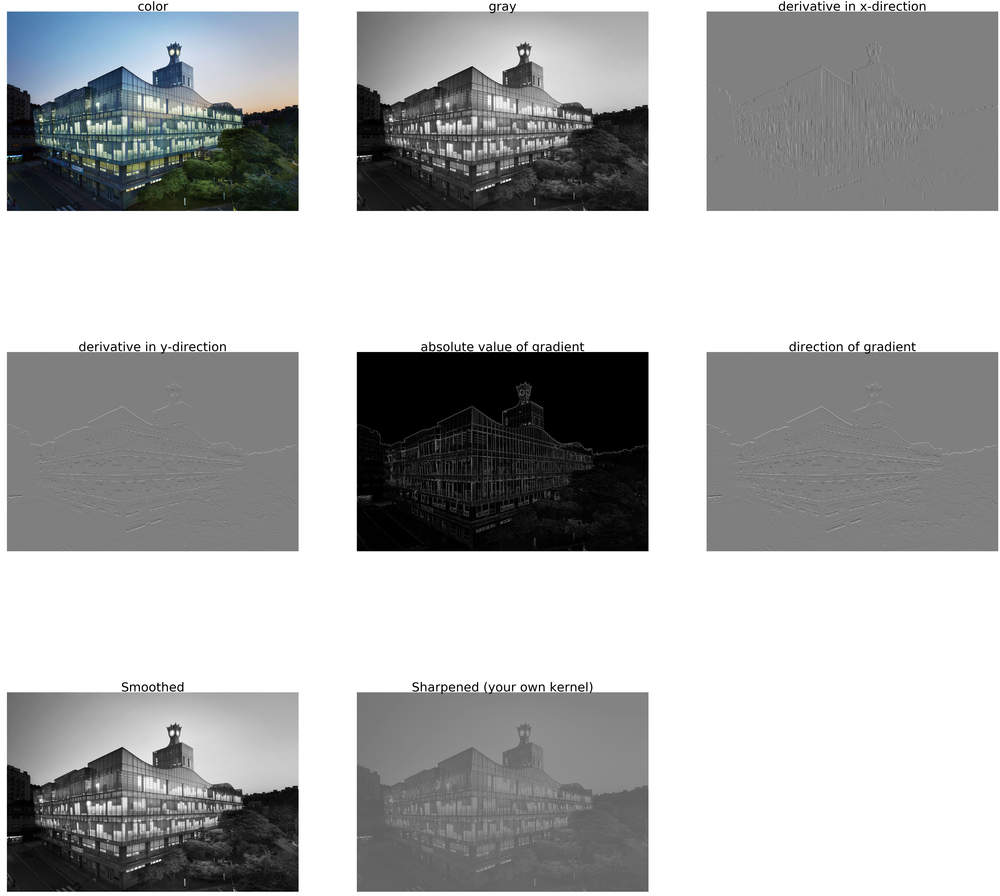

In [7]:
plt.figure(figsize=[100, 100])

# Essential Visualisation (1)
# input color image
p1 = plt.subplot(3,3,1)
p1.set_title('color', fontsize=70)
plt.imshow(im_color)
plt.axis('off')

# Essential Visualisation (2)
# input gray image
p2 = plt.subplot(3,3,2)
p2.set_title('gray', fontsize=70)
plt.imshow(im_gray, cmap='gray')
plt.axis('off')

# Essential Visualisation (3)
# derivative in x-direction
im_conv_x = signal.convolve2d(im_gray, x_deriv_kernel, boundary='symm', mode='same') 
p3 = plt.subplot(3,3,3)
p3.set_title('derivative in x-direction', fontsize=70)
plt.imshow(im_conv_x, cmap='gray')
plt.axis('off')


# Essential Visualisation (4)
# derivative in y-direction
im_conv_y = signal.convolve2d(im_gray, y_deriv_kernel, boundary='symm', mode='same') 
p4 = plt.subplot(3,3,4)
p4.set_title('derivative in y-direction', fontsize=70)
plt.imshow(im_conv_y, cmap='gray')
plt.axis('off')

# Essential Visualisation (5)
# absolute value of gradient
im_conv_grad_magnitude = compute_grad_magnitude(im_conv_x, im_conv_y)
p5 = plt.subplot(3,3,5)
p5.set_title('absolute value of gradient', fontsize=70)
plt.imshow(im_conv_grad_magnitude, cmap='gray')
plt.axis('off')

# Essential Visualisation (6)
# direction of gradient
im_conv_grad_direction = compute_grad_direction(im_conv_x, im_conv_y)
p6 = plt.subplot(3,3,6)
p6.set_title('direction of gradient', fontsize=70)
plt.imshow(im_conv_grad_direction, cmap='gray')
# x,y = np.meshgrid(np.arange(1347), np.arange(1968))
# plt.quiver(im_conv_x,im_conv_y)
plt.axis('off')


# Essential Visualisation (7)
# result image with smoothing kernel
im_conv_smooth = signal.convolve2d(im_gray, smooth_kernel, boundary='symm', mode='same') 
p7 = plt.subplot(3,3,7)
p7.set_title('Smoothed', fontsize=70)
plt.imshow(im_conv_smooth, cmap='gray')
plt.axis('off')

# Essential Visualisation (8)
# result image with your own kernel
im_conv_sharpen = signal.convolve2d(im_gray, sharpen_kernel, boundary='symm', mode='same') 
p8 = plt.subplot(3,3,8)
p8.set_title('Sharpened (your own kernel)', fontsize=70)
plt.imshow(im_conv_sharpen, cmap='gray')
plt.axis('off')

plt.show()